In [17]:
! pip install -qU "python-gdcm" pydicom pylibjpeg "opencv-python-headless" "scikit-image" "ipywidgets" "dicomsdl" "SimpleITK" "plotly" "fastai" "wandb"


[notice] A new release of pip is available: 23.0.1 -> 25.1.1
[notice] To update, run: pip install --upgrade pip


Notebook Color Scheme: 


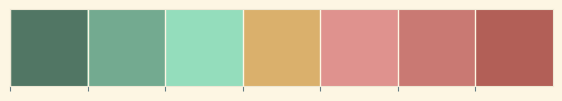

In [35]:
# 1. Handle datasets
import io
import os
import cv2
import pydicom
import dicomsdl
import numpy as np
import pandas as pd
from PIL import Image
from glob import glob
import tifffile as tiff
import SimpleITK as sitk
from pathlib import Path
from tqdm.auto import tqdm
import multiprocessing as mp
from collections import Counter
from joblib import Parallel, delayed
from pydicom.pixel_data_handlers.util import apply_voi_lut

# 2. Visualize datasets
import datetime as dtime
from datetime import datetime
import itertools
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import plotly.figure_factory as pff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.patches import Rectangle
from IPython.display import display_html

# 3. Preprocess datasets
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.impute import SimpleImputer, KNNImputer
## import iterative impute
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
## fastai
from fastai.data.all import *
from fastai.vision.all import *

# 6. ignore warnings   
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# 7. For displaying and wandb
import wandb
# wandb.login()
plt.style.use("Solarize_Light2")
plt.rcParams.update({'font.size': 16})

# 8. Customization
helper_dir = "/kaggle/input/roi-extract"
parent_dir = "/kaggle/input/rsna-breast-cancer-detection"
WANDB_PROJ_NAME = "RSNA_Breast_Cancer_Detection"
CONFIG = {
    'competition': 'RSNA_Breast_Cancer',
    '_wandb_kernel': 'aot'
}

my_colors = ['#517664', '#73AA90', '#94DDBC', '#DAB06C',
             '#DF928E', '#C97973', '#B25F57']
CMAP1 = ListedColormap(my_colors)
print("Notebook Color Scheme: ")
sns.palplot(sns.color_palette(my_colors))
plt.show()

In [28]:
from kaggle_secrets import UserSecretsClient
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("wandb")

! wandb login $secret_value_0

wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin


# General Functionalities

In [21]:
def set_seed(seed = 1234):
    np.random.seed(seed)
    random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    
    # On CuDNN we need 2 further options
    torch.backends.cudnn.deterministic = True
    os.environ['PYTHONHASHSEED'] = str(seed)
def show_values_on_bars(axs, h_v = 'v', space = 0.4):
    def _show_on_single_plot(ax):
        if h_v == 'v':
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height()
                
                value = int(p.get_height())
                ax.text(_x, _y, format(value, ','), ha='center')
        elif h_v == 'h':
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)
                _y = p.get_x() + p.get_height()
                
                value = int(p.get_width())
                ax.text(_x, _y, format(value, ','), ha='left')
    
    if isinstance(axs, np.ndarray):
        for i, ax in np.ndenumerate(axs):
            _show_on_single_plot(ax)
    else:
        _show_on_single_plot(axs)

In [25]:
# === WANDB === 
def save_dataset_artifact(run_name, artifact_name, path, data_type = "dataset"):
    run = wandb.init(project=WANDB_PROJ_NAME,
                     name = run_name,
                     config= CONFIG)

    artifact = wandb.Artifact(name = artifact_name,
                              type = data_type)
    artifact.add_file(path)
    
    wandb.log_artifact(artifact)
    wandb.finish()
    print("Artifact has been save successfully!")


def create_wandb_plot(x_data = None, y_data = None, x_name = None, y_name = None,
                      title = None, log = None, plot = "line"):
    data = [
        [label, val] for (label, val) in zip(x_data, y_data)
    ]
    table = wandb.Table(data = data, columns = [x_name, y_name])
    
    if plot == "line":
        wandb.log({ log: wandb.plot.line(table, x_name, y_name, title=title) })
    elif plot == "bar":
        wandb.log({ log: wandb.plot.bar(table, x_name, y_name, title=title) })
    elif plot == "scatter":
        wandb.log({ log: wandb.plot.scatter(table, x_name, y_name, title=title) })

In [24]:
def create_wandb_hist(x_data = None, x_name = None, title = None, log = None):
    data = [[x] for x in x_data]
    table = wandb.Table(data = data, columns=[x_name])
    wandb.log({ log: wandb.plot.histogram(table, x_name, title=title) })

In [34]:
run = wandb.init(project='RSNA_Breast_Cancer_Detection', name='CoverPhoto', config=CONFIG)
cover = plt.imread("/kaggle/input/rsna-breast-cancer-helper-data/DKn4ofz.png")
wandb.log({"cover": wandb.Image(cover)})
wandb.finish()

In [40]:
train_df = pd.read_csv(os.path.join(parent_dir, "train.csv"))

train_image_path = os.path.join(helper_dir, "train_image_ROI_processed_jp2000_512")

all_paths = []
for k in tqdm(range(len(train_df))):
    row = train_df.iloc[k, :]
    all_paths.append(
        os.path.join(
            train_image_path, str(row.patient_id), f"{str(row.image_id)}.jp2"
        ) 
    )
    
train_df['path'] = all_paths

  0%|          | 0/54706 [00:00<?, ?it/s]

In [45]:
train_df[train_df['patient_id'] == 38739]

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,path
26885,1,38739,1542942132,L,CC,62.0,0,0,0,NaN,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1542942132.jp2
26886,1,38739,1680423653,L,MLO,62.0,0,0,0,NaN,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1680423653.jp2
26887,1,38739,1110010839,R,AT,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1110010839.jp2
26888,1,38739,1189630231,R,CC,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1189630231.jp2
26889,1,38739,1632645203,R,CC,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1632645203.jp2
26890,1,38739,1856537005,R,MLO,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1856537005.jp2
26891,1,38739,1889694445,R,MLO,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1889694445.jp2
26892,1,38739,2070012385,R,CC,62.0,0,0,0,2.0,0,C,49,False,/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/2070012385.jp2


In [46]:
print("Number of TOTAL images:     ",
      len(glob.glob(os.path.join(train_image_path, "*", "*"))))

print(
    "Records gathered in Site 1: ",
    train_df['site_id'].value_counts().values[0], "\n" +
    "Records gathered in Site 2: ",
    train_df['site_id'].value_counts().values[1], "\n"
)

print("--------------------------------------------------------------------------------")
print(
    "Total unique patients: ",
    train_df['patient_id'].unique()
)
print("--------------------------------------------------------------------------------")
print(
    "Total unique images: ",
    train_df['image_id'].unique()
)
print("--------------------------------------------------------------------------------")
print(
    "Statistic: Image_per_patient",
    train_df.groupby('patient_id')['image_id'].count().reset_index().describe()['image_id']
)
print("--------------------------------------------------------------------------------")
print(
    "Image records count per laterality (R)",
    train_df['laterality'].value_counts().values[0], "\n" + 
    "Image records count per laterality (L)",
    train_df['laterality'].value_counts().values[1]
)
print("--------------------------------------------------------------------------------")
print(
    "Image records count per view",
    train_df['view'].value_counts()
)
print("--------------------------------------------------------------------------------")

Number of TOTAL images:      54611
Records gathered in Site 1:  29519 
Records gathered in Site 2:  25187 

--------------------------------------------------------------------------------
Total unique patients:  [10006 10011 10025 ...   997  9973  9989]
--------------------------------------------------------------------------------
Total unique images:  [ 462822612 1459541791 1864590858 ... 1078943060  398038886  439796429]
--------------------------------------------------------------------------------
Statistic: Image_per_patient count    11913.000000
mean         4.592126
std          1.133216
min          4.000000
25%          4.000000
50%          4.000000
75%          5.000000
max         14.000000
Name: image_id, dtype: float64
--------------------------------------------------------------------------------
Image records count per laterality (R) 27439 
Image records count per laterality (L) 27267
--------------------------------------------------------------------------------


In [50]:
run = wandb.init(project="RSNA_Breast_Cancer_Detection", name="view_sample", config=CONFIG)

In [51]:
def show_view(view_name, sample_size):
    
    if view_name != "LMO":
        data = train_df[train_df['view'] == view_name].sample(sample_size,
                                                              random_state=42)
        img_path = data['path'].to_list()
        
        fig, axis = plt.subplots(1, sample_size, figsize=(20, 4))
        axis = axis.flatten()
        wandb_images = []
        
        for k, path in enumerate(img_path):
            axis[k].set_title(f"{k+1}. {view_name}",
                              fontsize=16, color=my_colors[0], weight='bold')
            
            try:
                img = plt.imread(path)
            except Exception as e:
                print(f"[WARN] Failed to load {path}: {e}")
                img = np.zeros((512, 512), dtype=np.uint8)
            
            
            wandb_images.append(wandb.Image(img))
            axis[k].imshow(img, cmap="turbo")
            axis[k].axis("off")
        
        plt.tight_layout()
        plt.show()
        wandb.log({f"{view_name}": wandb_images})
    else:
        path = train_df[train_df['view'] == "LMO"]['path'].item()
        
        fig, axis = plt.subplots(1, sample_size, figsize=(20, 4))
        axis = axis.flatten()
        wandb_images = []
        
        try:
            img = plt.imread(path)
        except Exception as e:
            print(f"[WARN] Failed to load {path}: {e}")
            img = np.zeros((512, 512), dtype=np.uint8)
        
        
            
        wandb_images.append(wandb.Image(img))
        
        axis[0].set_title(f"{1}. LMO",
                              fontsize=16, color=my_colors[0], weight='bold')
        axis[0].imshow(img, cmap="turbo")
        axis[0].axis("off")
        axis[1].axis("off")
        axis[2].axis("off")
        axis[3].axis("off")
        axis[4].axis("off")
        
        plt.tight_layout()
        plt.show()
        wandb.log({f"LMO": wandb_images})  

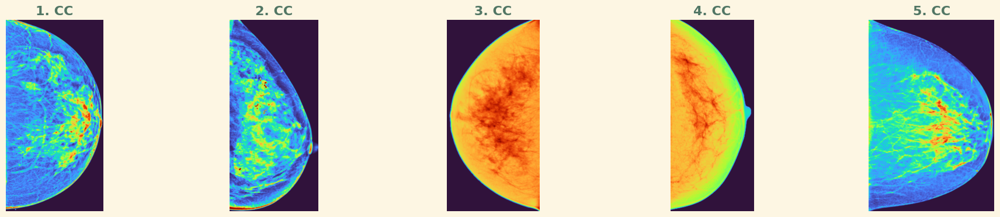

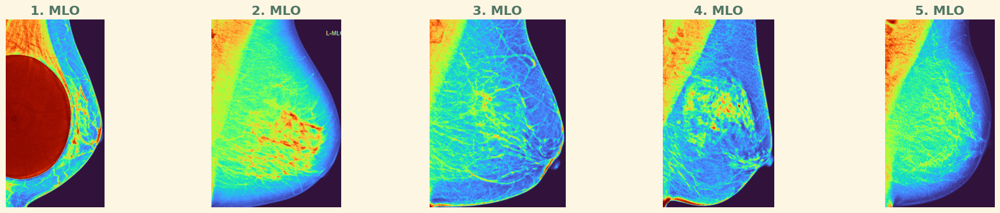

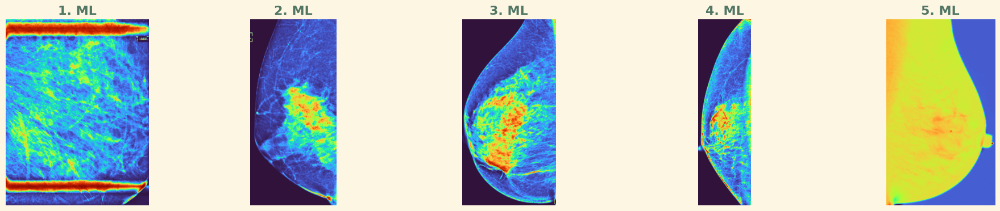

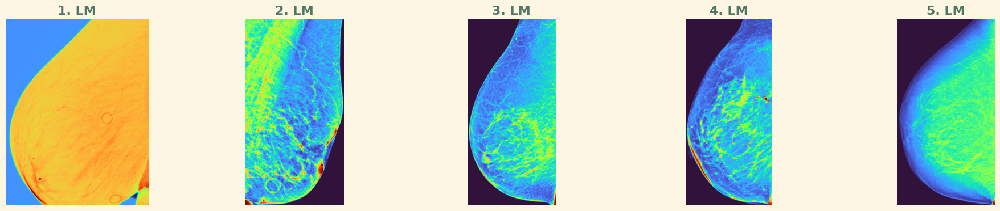

[WARN] Failed to load /kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1110010839.jp2: [Errno 2] No such file or directory: '/kaggle/input/roi-extract/train_image_ROI_processed_jp2000_512/38739/1110010839.jp2'


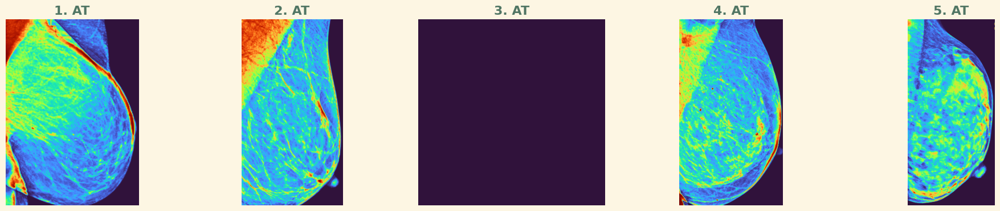

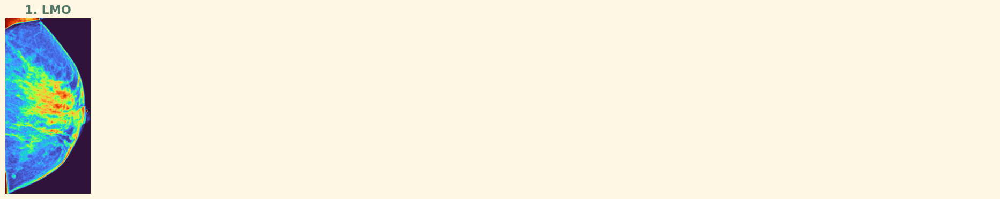

In [52]:
for view_name in train_df['view'].unique().tolist():
    show_view(view_name, sample_size=5)

In [53]:
wandb.finish()

# Checking Age

In [54]:
run = wandb.init(project=WANDB_PROJ_NAME, name="age_hist", config=CONFIG)

In [55]:
train_df['age'].describe()

count    54669.000000
mean        58.543928
std         10.050884
min         26.000000
25%         51.000000
50%         59.000000
75%         66.000000
max         89.000000
Name: age, dtype: float64

Mean of age = 58.54392800307304
Median of age = 59.0
Mode of age = 50.0


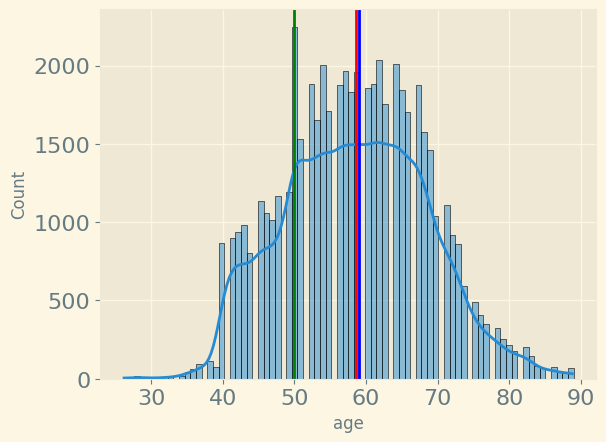

In [56]:
sns.histplot(train_df["age"], kde=True)
plt.axvline(train_df['age'].mean(), color='red')
plt.axvline(train_df['age'].median(), color='blue')
plt.axvline(train_df['age'].mode()[0], color='green')

print(f"Mean of age = {train_df['age'].mean()}")
print(f"Median of age = {train_df['age'].median()}")
print(f"Mode of age = {train_df['age'].mode()[0]}")

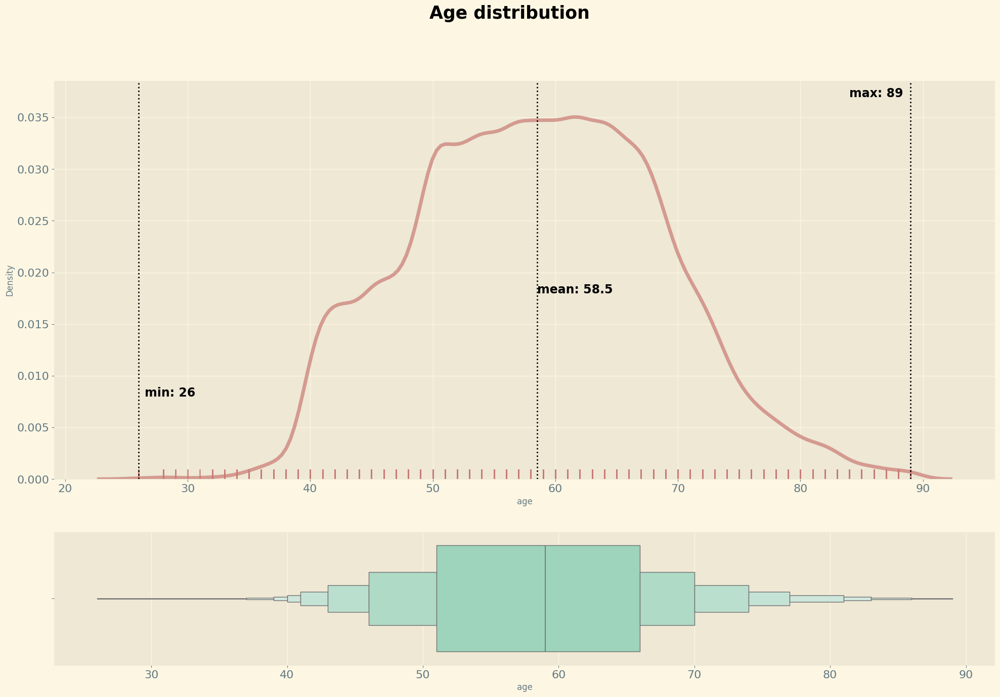

In [57]:
f, (a0, a1) = plt.subplots(2, 1, gridspec_kw={ 'height_ratios': [3, 1] }, figsize=(24,15))

# KDE Plot
sns.kdeplot(data=train_df['age'], ax=a0,
            color=my_colors[5], lw=5, alpha=0.7)
sns.rugplot(data=train_df['age'], ax=a0, color=my_colors[5])

a0.axvline(x=58.5, ls=":", lw=2, color="black")
a0.text(x=58.5, y=0.018, s="mean: 58.5", size=17, color="black", weight="bold")
a0.axvline(x=26, ls=":", lw=2, color="black")
a0.text(x=26.5, y=0.008, s="min: 26", size=17, color="black", weight="bold")
a0.axvline(x=89, ls=":", lw=2, color="black")
a0.text(x=84, y=0.037, s="max: 89", size=17, color="black", weight="bold")

sns.boxenplot(x=train_df['age'], ax=a1, color=my_colors[2])

plt.suptitle("Age distribution", weight="bold", size=25)
sns.despine(right=True, top=True, left=True)


In [58]:
create_wandb_hist(x_data=train_df['age'],
                  x_name="Age",
                  title="Age Distribution",
                  log="age_hist")

In [59]:
train_df['cancer'].value_counts()

cancer
0    53548
1     1158
Name: count, dtype: int64

In [60]:
noCancer = 53548
cancer = 1158
total = noCancer + cancer

noCancer_prec = noCancer / total
cancer_perc = cancer / total
print(f"Percentage of clean patients in the dataset: {noCancer_prec:.2f}%")
print(f"Percentage of patients with cancer in the dataset: {cancer_perc:.2f}%")

difference_perc = ((noCancer_prec - cancer_perc) / cancer_perc) * 100
print(f"Clean patients are {difference_perc:.2f}% more than patients with cancer.")

Percentage of clean patients in the dataset: 0.98%
Percentage of patients with cancer in the dataset: 0.02%
Clean patients are 4524.18% more than patients with cancer.


In [62]:
fig = px.histogram(train_df, x="age", color="cancer")
fig.show()

In [63]:
train_df[train_df['cancer'] == 0]['age'].describe()

count    53511.000000
mean        58.432808
std         10.023210
min         26.000000
25%         51.000000
50%         58.000000
75%         66.000000
max         89.000000
Name: age, dtype: float64

In [64]:
train_df[train_df['cancer'] == 1]['age'].describe()

count    1158.000000
mean       63.678756
std         9.991980
min        38.000000
25%        56.000000
50%        64.500000
75%        71.000000
max        89.000000
Name: age, dtype: float64

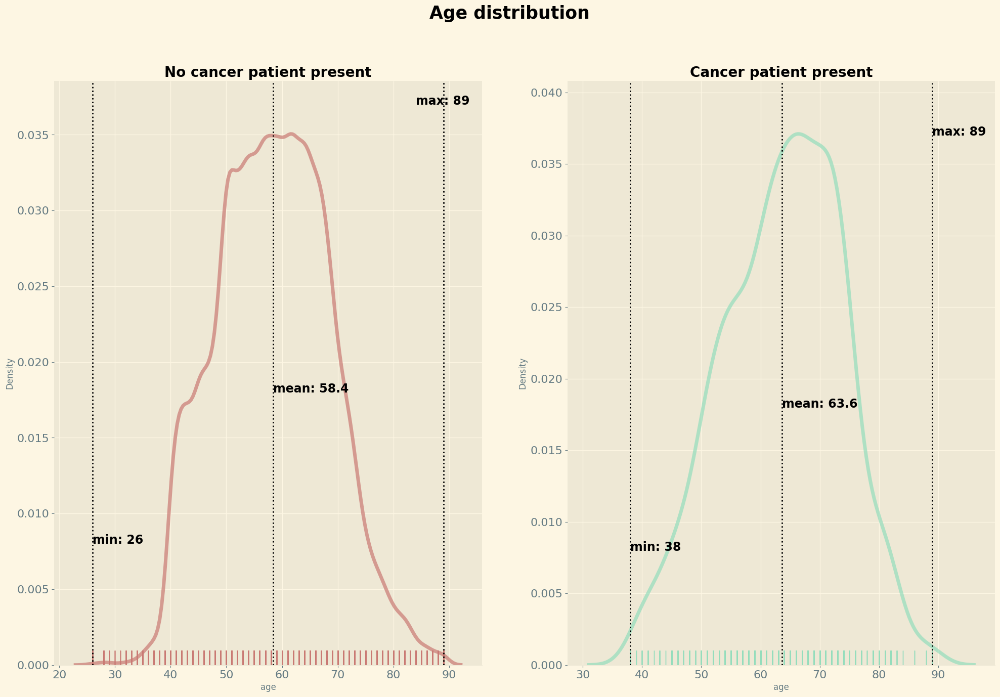

In [65]:
f, (a0, a1) = plt.subplots(1, 2, figsize=(24, 15))

# First plot — No cancer
sns.kdeplot(
    data=train_df[train_df['cancer'] == 0], x="age",
    fill=False, ax=a0,
    linewidth=5, color=my_colors[5], alpha=0.7
)
sns.rugplot(
    data=train_df[train_df['cancer'] == 0], x="age",
    ax=a0, color=my_colors[5]
)

a0.set_title("No cancer patient present", weight="bold", size=20)
a0.axvline(x=58.4, ls=":", lw=2, color="black")
a0.text(x=58.4, y=0.018, s="mean: 58.4", size=17, color="black", weight="bold")
a0.axvline(x=26, ls=":", lw=2, color="black")
a0.text(x=26, y=0.008, s="min: 26", size=17, color="black", weight="bold")
a0.axvline(x=89, ls=":", lw=2, color="black")
a0.text(x=84, y=0.037, s="max: 89", size=17, color="black", weight="bold")

# Second plot — Cancer
sns.kdeplot(
    data=train_df[train_df['cancer'] == 1], x="age",
    fill=False, ax=a1,
    linewidth=5, color=my_colors[2], alpha=0.7
)
sns.rugplot(
    data=train_df[train_df['cancer'] == 1], x="age",
    ax=a1, color=my_colors[2]
)

a1.set_title("Cancer patient present", weight="bold", size=20)
a1.axvline(x=63.6, ls=":", lw=2, color="black")
a1.text(x=63.6, y=0.018, s="mean: 63.6", size=17, color="black", weight="bold")
a1.axvline(x=38, ls=":", lw=2, color="black")
a1.text(x=38, y=0.008, s="min: 38", size=17, color="black", weight="bold")
a1.axvline(x=89, ls=":", lw=2, color="black")
a1.text(x=89, y=0.037, s="max: 89", size=17, color="black", weight="bold")

plt.suptitle("Age distribution", weight="bold", size=25)
sns.despine(right=True, top=True, left=True)

In [66]:
create_wandb_hist(x_data = train_df[train_df['cancer'] == 1]['age'],
                  x_name="Age",
                  title="Age Distribution - patients with cancer",
                  log="age_hist_cancer")

In [68]:
wandb.finish()

# Checking Implant

In [69]:
train_df['implant'].value_counts()

implant
0    53229
1     1477
Name: count, dtype: int64

In [70]:
nonImplants = 53229
implants = 1477
total = nonImplants + implants

nonImplants_prec = nonImplants / total
implants_perc = implants / total
print(f"Percentage of nonImplants in the dataset: {nonImplants_prec:.2f}%")
print(f"Percentage of patients with implants in the dataset: {implants_perc:.2f}%")

difference_perc = ((nonImplants - implants) / implants) * 100
print(f"nonImplants are {difference_perc:.2f}% more than patients with implants.")

Percentage of nonImplants in the dataset: 0.97%
Percentage of patients with implants in the dataset: 0.03%
nonImplants are 3503.86% more than patients with implants.


In [71]:
fig = px.pie(train_df, "implant", color="implant")
fig.show()

In [72]:
run = wandb.init(project=WANDB_PROJ_NAME,name="implant_sample",config=CONFIG)

In [73]:
def show_images_with_flags(col, col_flag, sample_size, cancer_flag = 0):
    
    # Get image info
    data = train_df[train_df[col] == col_flag].sample(sample_size, random_state=42)
    
    if cancer_flag == 1:
        data = train_df[train_df.cancer == 1]
        data = train_df[train_df[col] == col_flag].sample(sample_size, random_state=42)
    
    image_path = data['path'].to_list()
    
    ## == Plot ==
    fig, axis = plt.subplots(1, sample_size, figsize=(23, 4))
    axis = axis.flatten()
    wandb_images = []
    
    for k, path in enumerate(image_path):
        axis[k].set_title(f"{k+1}/ {col_flag}",
                          fontsize= 14, color=my_colors[0], weight="bold")
        img = plt.imread(path)
        wandb_images.append(wandb.Image(img))
        axis[k].imshow(img, cmap="turbo")
        axis[k].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # == Log image to wandb ==
    wandb.log({f"{col}_{col_flag}": wandb_images})

Records with no implants = 53229 

Records with implants = 1477 



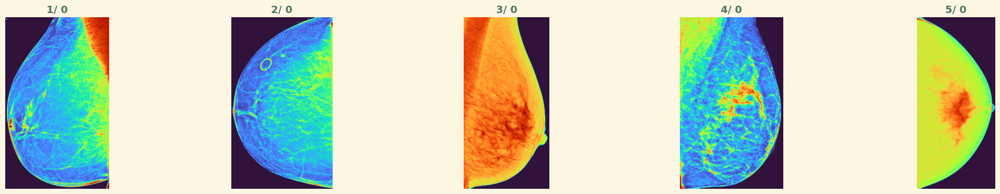

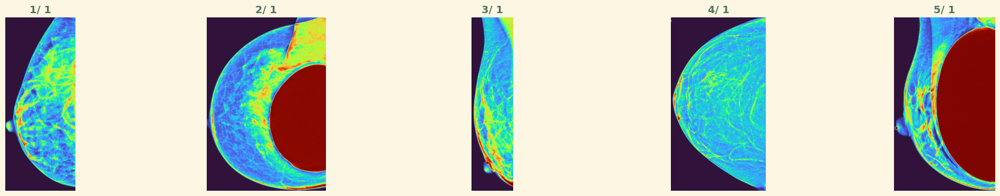

In [74]:
print(f"Records with no implants = {train_df['implant'].value_counts().values[0]} \n")
print(f"Records with implants = {train_df['implant'].value_counts().values[1]} \n")

for implant_flag in train_df['implant'].unique().tolist():
    show_images_with_flags(col="implant", col_flag=implant_flag, sample_size=5)

Records with no cancer = 53548 

Records with cancer = 1158 



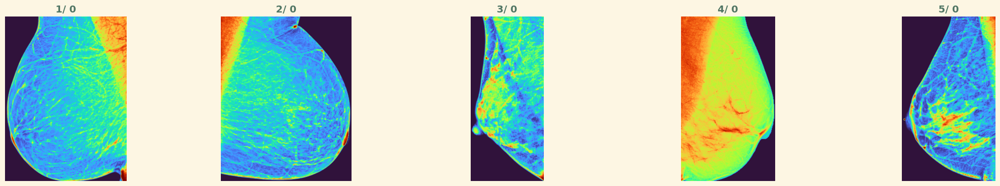

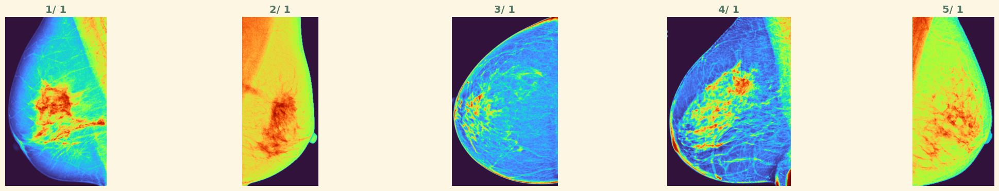

In [75]:
print(f"Records with no cancer = {train_df['cancer'].value_counts().values[0]} \n")
print(f"Records with cancer = {train_df['cancer'].value_counts().values[1]} \n")

for cancer_flag in train_df['cancer'].unique().tolist():
    show_images_with_flags(col="cancer", col_flag=cancer_flag, sample_size=5)

# What about invasive?
### Invasive is for cases when cancer was present and had moved to other organs

Records with no invasive cancer = 53888 

Records with invasive cancer = 818 



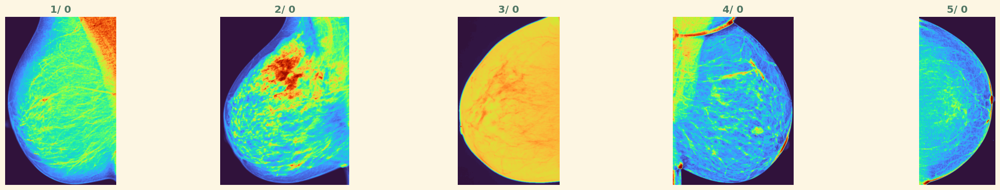

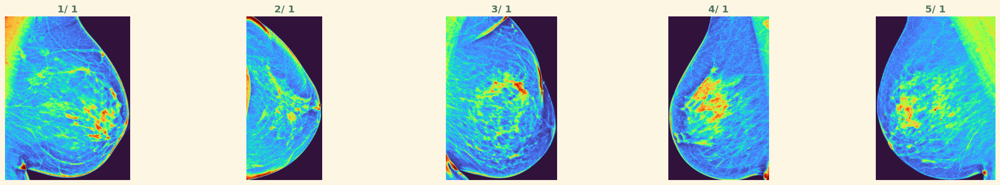

In [76]:
print(f"Records with no invasive cancer = {train_df['invasive'].value_counts().values[0]} \n")
print(f"Records with invasive cancer = {train_df['invasive'].value_counts().values[1]} \n")

for invasive_flag in train_df['invasive'].unique().tolist():
    show_images_with_flags(col="invasive", col_flag=invasive_flag, sample_size=5, cancer_flag=1)

# Explore difficult_negative_case
### If some cases are particularly difficult to treat.

Records not particularly difficult = 47001 

Records particularly difficult = 7705 



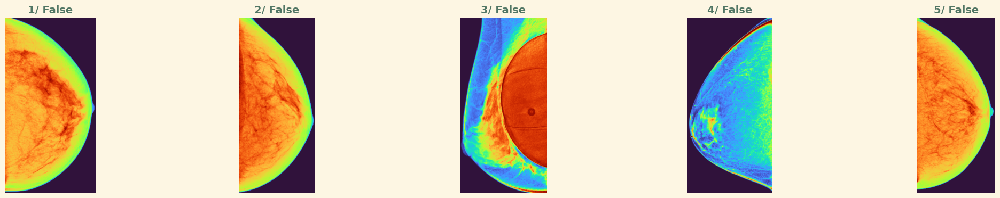

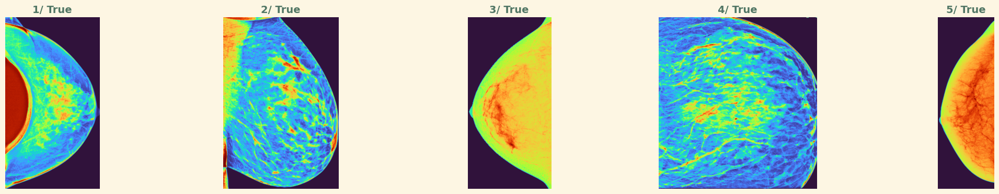

In [77]:
print(f"Records not particularly difficult = {train_df['difficult_negative_case'].value_counts().values[0]} \n")
print(f"Records particularly difficult = {train_df['difficult_negative_case'].value_counts().values[1]} \n")

for difficult_flag in train_df['difficult_negative_case'].unique().tolist():
    show_images_with_flags(col="difficult_negative_case", col_flag=difficult_flag, sample_size=5, cancer_flag=1)

In [78]:
wandb.finish()

# Check null and missing values

In [79]:
train_df.isnull().sum()

site_id                        0
patient_id                     0
image_id                       0
laterality                     0
view                           0
age                           37
cancer                         0
biopsy                         0
invasive                       0
BIRADS                     28420
implant                        0
density                    25236
machine_id                     0
difficult_negative_case        0
path                           0
dtype: int64

## Feature Importance

In [80]:
from scipy.stats import chi2_contingency

contingency = pd.crosstab(train_df['laterality'], train_df['cancer'])
chi2, p, dof, ex = chi2_contingency(contingency)

print(f"p-value: {p:.4f}")

p-value: 0.5398
